In [2]:
# Importación de bibliotecas necesarias
import numpy as np  
import pandas as pd 

# Lectura del archivo CSV en un DataFrame
data = pd.read_csv("D:\\Descargas\\diabetes.csv")

data

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63,0
764,2,122,70,27,0,36.8,0.340,27,0
765,5,121,72,23,112,26.2,0.245,30,0
766,1,126,60,0,0,30.1,0.349,47,1


In [3]:
# Proporcionar información del df
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


Puntuación de precisión: 0.7337662337662337
Pregnancies: 0.06
Glucose: 0.29
BloodPressure: 0.12
SkinThickness: 0.06
Insulin: 0.03
BMI: 0.20
DiabetesPedigreeFunction: 0.13
Age: 0.12


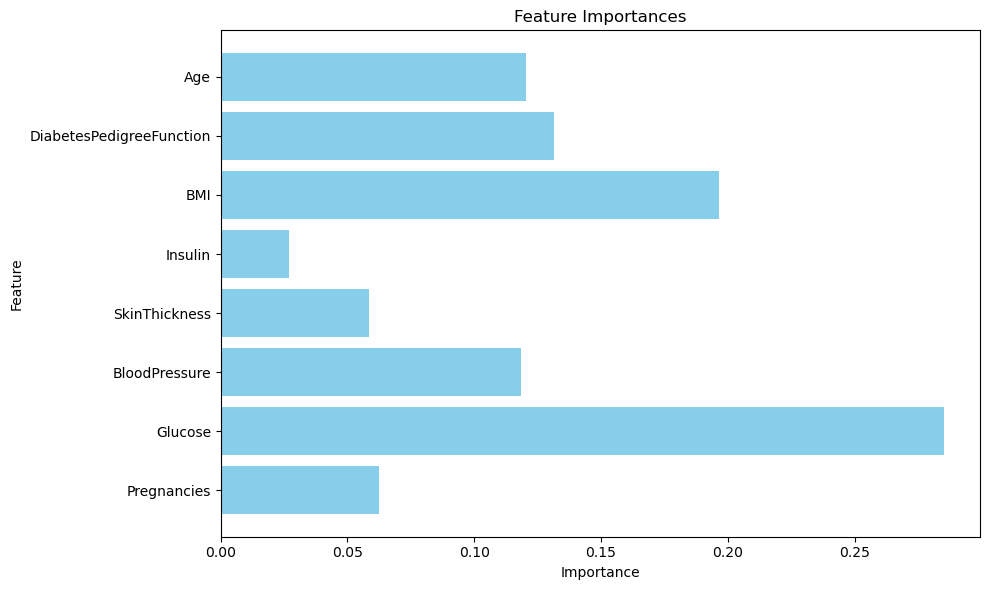

In [4]:
# Extraer los valores de la variable objetivo ('Outcome') en un arreglo separado
y = data.Outcome.values

# Eliminar la variable objetivo ('Outcome') para aislar las columnas de características
x_data = data.drop(["Outcome"], axis=1)

# Normalización de los valores de las características
x = (x_data - np.min(x_data)) / (np.max(x_data) - np.min(x_data))

# Importación de la función train_test_split para dividir los datos en conjuntos de entrenamiento y prueba
from sklearn.model_selection import train_test_split

# Dividir los datos en set de entrenamiento y prueba
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=73)

# Importación de la clase DecisionTreeClassifier para construir un modelo de árbol de decisión
from sklearn.tree import DecisionTreeClassifier

# Creación de una instancia de la clase DecisionTreeClassifier
dt = DecisionTreeClassifier()

# Entrenamiento del modelo de árbol de decision con el set de entrenamiento
dt.fit(x_train, y_train)

# Imprime el puntaje de precisión del modelo de árbol de decisiones en los datos de prueba
print("Puntuación de precisión:", dt.score(x_test, y_test))


import matplotlib.pyplot as plt
from sklearn.tree import plot_tree
# Importancias de las características
feature_importances = dt.feature_importances_

feature_importance_df = pd.DataFrame({
    'Feature': x.columns,
    'Importance': feature_importances
})

# Imprime las importancias de las características
for name, importance in zip(x.columns, feature_importances):
    print(f"{name}: {importance:.2f}")

# Crea grafico de barras con las importancias de las características en sentido horizontal para facilitar
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'], color='skyblue')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importances')
plt.tight_layout()
plt.show()


In [5]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

# Plot decision tree
plt.figure(figsize=(400,200))
plot_tree(dt, feature_names=data.columns[:-1], class_names=['Non-Diabetic', 'Diabetic'], filled=True)
plt.show()